In [25]:
import json
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
with open(os.path.join('/opt/ml/input/data/medical', 'ufo/train.json'), 'r') as f:
    anno = json.load(f)
    

In [26]:
print(f'len anno : {len(anno)}')
print(f'len train anno : {len(anno["images"])}')
print(list(anno['images'].keys()))

len anno : 1
len train anno : 520
['drp.en_ko.in_house.deepnatural_002411.jpg', 'drp.en_ko.in_house.deepnatural_002418.jpg', 'drp.en_ko.in_house.deepnatural_002432.jpg', 'drp.en_ko.in_house.deepnatural_002441.jpg', 'drp.en_ko.in_house.deepnatural_002451.jpg', 'drp.en_ko.in_house.deepnatural_002469.jpg', 'drp.en_ko.in_house.deepnatural_002474.jpg', 'drp.en_ko.in_house.deepnatural_002479.jpg', 'drp.en_ko.in_house.deepnatural_002485.jpg', 'drp.en_ko.in_house.deepnatural_002491.jpg', 'drp.en_ko.in_house.deepnatural_002496.jpg', 'drp.en_ko.in_house.deepnatural_002508.jpg', 'drp.en_ko.in_house.deepnatural_002514.jpg', 'drp.en_ko.in_house.deepnatural_002520.jpg', 'drp.en_ko.in_house.deepnatural_002528.jpg', 'drp.en_ko.in_house.deepnatural_002539.jpg', 'drp.en_ko.in_house.deepnatural_002544.jpg', 'drp.en_ko.in_house.deepnatural_002553.jpg', 'drp.en_ko.in_house.deepnatural_002555.jpg', 'drp.en_ko.in_house.deepnatural_002624.jpg', 'drp.en_ko.in_house.deepnatural_002628.jpg', 'drp.en_ko.in_house.

In [27]:

print(anno['images']['drp.en_ko.in_house.deepnatural_002411.jpg'].keys())

dict_keys(['paragraphs', 'words', 'chars', 'img_w', 'img_h', 'tags', 'relations', 'annotation_log', 'license_tag'])


In [28]:
# 002411, 002803
data_dir = "/opt/ml/input/data/medical/img/train/"
img_path = "finance/bank_00096.jpg"

ignore_tags = ['masked', 'excluded-region', 'maintable', 'stamp']


In [29]:
vertices, labels = [],[]
for word_info in anno['images'][img_path]['words'].values():
    word_tags = word_info['tags']

    ignore_sample = any(elem for elem in word_tags if elem in ignore_tags)
    num_pts = np.array(word_info['points']).shape[0]

    # skip samples with ignore tag and
    # samples with number of points greater than 4
    if ignore_sample or num_pts > 4:
        continue

    vertices.append(np.array(word_info['points']))
    labels.append(int(not word_info['illegibility']))
    
vertices, labels = np.array(vertices, dtype=np.float32), np.array(labels, dtype=np.int64)
# word_bboxes = np.reshape(vertices, (-1, 4, 2))
vertices.shape

(235, 4, 2)

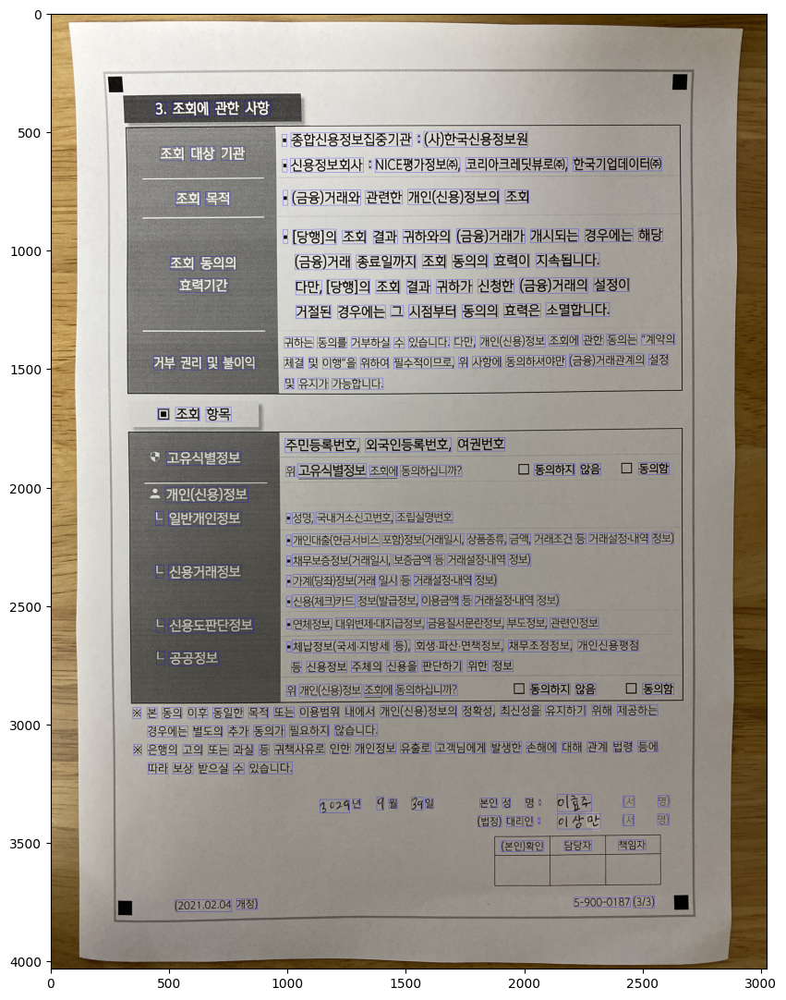

In [30]:
img = cv2.imread(os.path.join(data_dir,img_path))
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

for polygon in vertices:
    cv2.polylines(img, [np.array(polygon, dtype=np.int32)], True, (0,0,255),1)
plt.figure(figsize=(10,15))
plt.imshow(img)
plt.show()

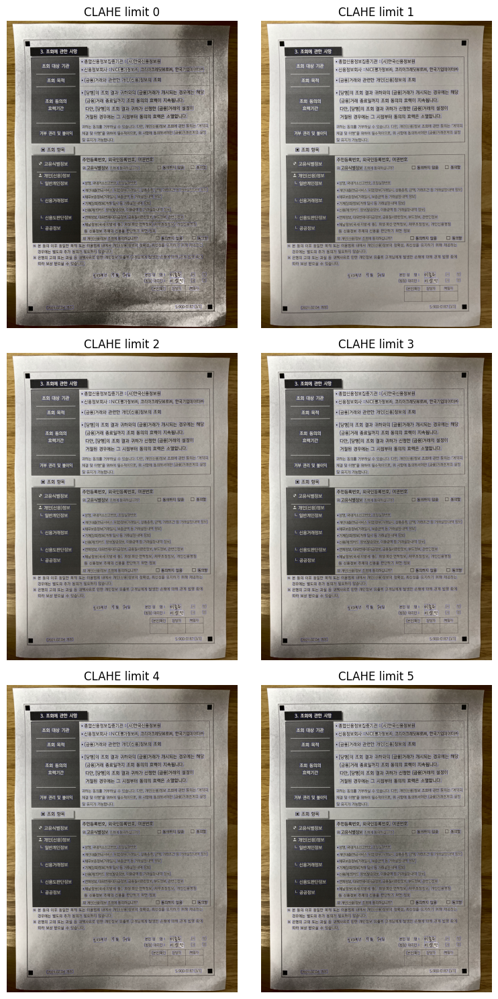

In [31]:
import albumentations as A

img = cv2.imread(os.path.join(data_dir,img_path))
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

fig , axs = plt.subplots(3,2, figsize=(8,15))
for i,ax in enumerate(axs.flat):
    transform = A.Compose([
        A.CLAHE((float(i),float(i)),tile_grid_size=(3,3),always_apply=True)
    ])
    imgi = transform(image=img)['image']
        
    for polygon in vertices:
        cv2.polylines(imgi, [np.array(polygon, dtype=np.int32)], True, (0,0,255),1)
        
    ax.imshow(imgi)
    ax.axis('off')
    ax.set_title(f"CLAHE limit {i}")
plt.tight_layout()
plt.show()

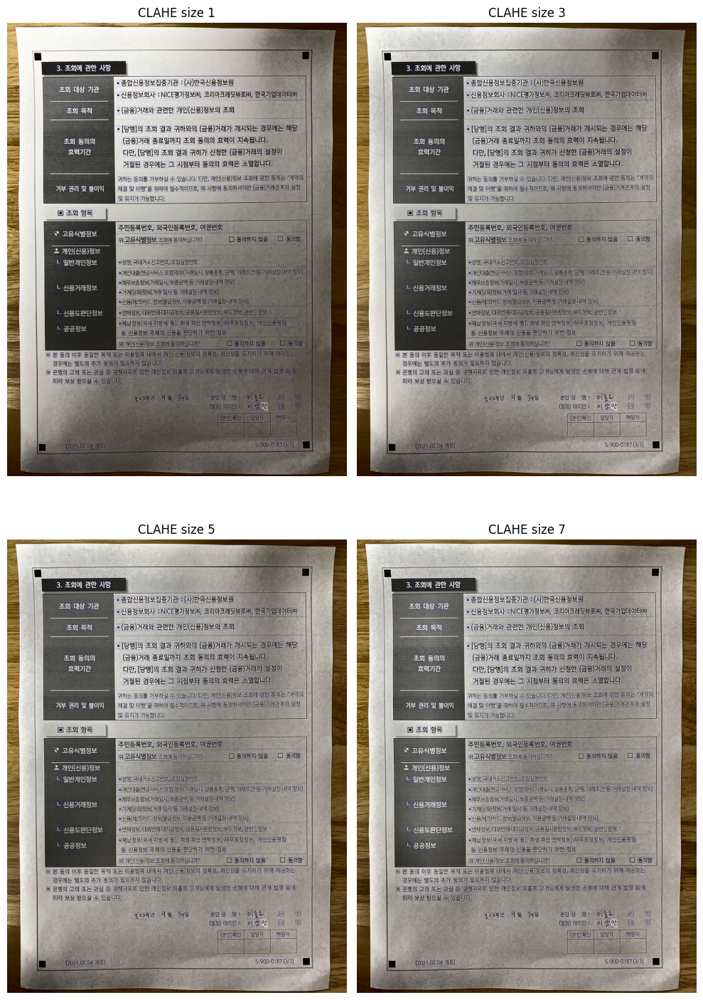

In [32]:
import albumentations as A

img = cv2.imread(os.path.join(data_dir,img_path))
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

fig , axs = plt.subplots(2,2, figsize=(10,15))
for i,ax in enumerate(axs.flat):
    transform = A.Compose([
        A.CLAHE((4.0,4.0),tile_grid_size=(i*2+1,i*2+1),always_apply=True)
    ])
    imgi = transform(image=img)['image']
        
    for polygon in vertices:
        cv2.polylines(imgi, [np.array(polygon, dtype=np.int32)], True, (0,0,255),1)
        
    ax.imshow(imgi)
    ax.axis('off')
    ax.set_title(f"CLAHE size {i*2+1}")
plt.tight_layout()
plt.show()

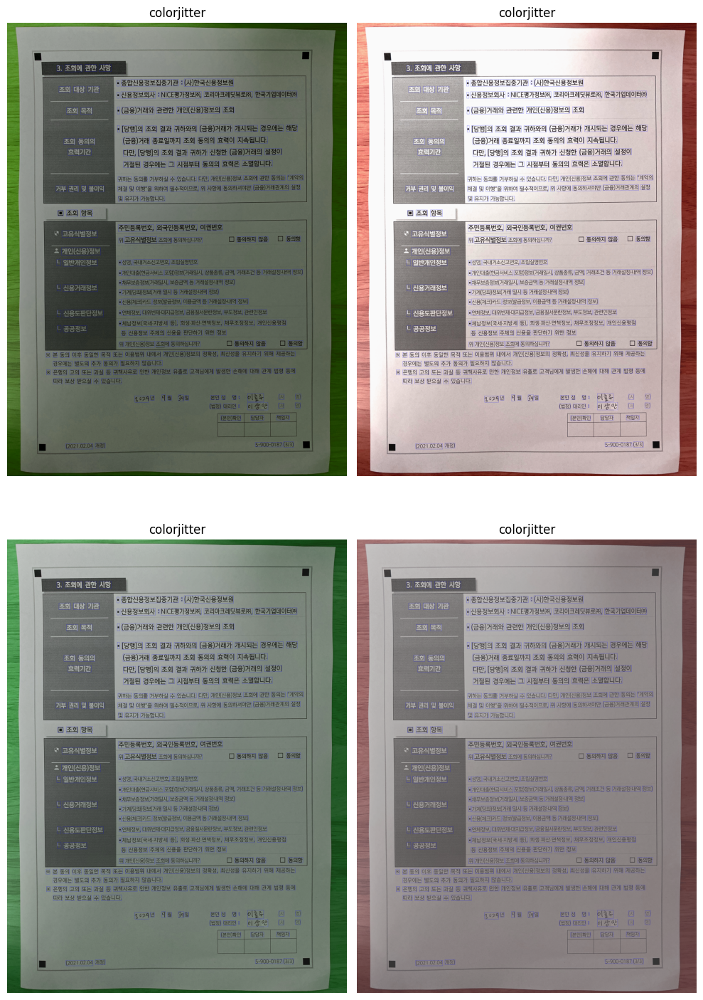

In [33]:
import albumentations as A

img = cv2.imread(os.path.join(data_dir,img_path))
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

fig , axs = plt.subplots(2,2, figsize=(10,15))
for i,ax in enumerate(axs.flat):
    transform = A.Compose([
        A.ColorJitter(0.5, 0.5, 0.5, 0.25,always_apply=True)
    ])
    imgi = transform(image=img)['image']
        
    for polygon in vertices:
        cv2.polylines(imgi, [np.array(polygon, dtype=np.int32)], True, (0,0,255),1)
        
    ax.imshow(imgi)
    ax.axis('off')
    ax.set_title(f"colorjitter")
plt.tight_layout()
plt.show()

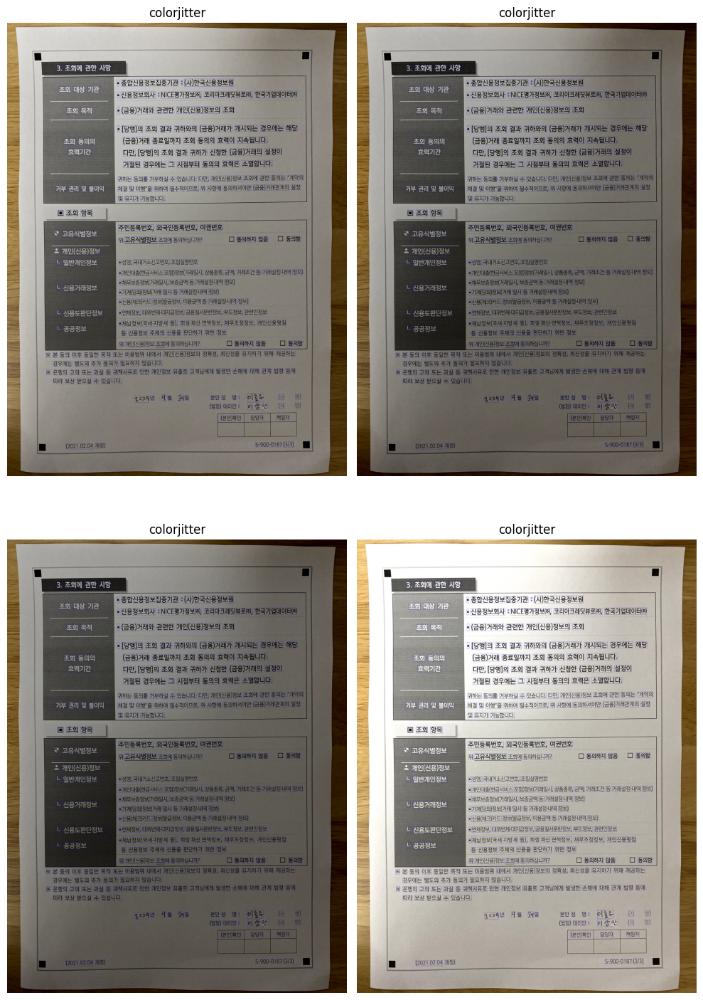

In [34]:
import albumentations as A

img = cv2.imread(os.path.join(data_dir,img_path))
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

fig , axs = plt.subplots(2,2, figsize=(10,15))
for i,ax in enumerate(axs.flat):
    transform = A.Compose([
        A.RandomBrightnessContrast(always_apply=True)
    ])
    imgi = transform(image=img)['image']
        
    for polygon in vertices:
        cv2.polylines(imgi, [np.array(polygon, dtype=np.int32)], True, (0,0,255),1)
        
    ax.imshow(imgi)
    ax.axis('off')
    ax.set_title(f"colorjitter")
plt.tight_layout()
plt.show()

In [35]:
img = cv2.imread(os.path.join(data_dir,img_path))
img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)

keypoints = [(x, y, f'point_{i}_{j}') for i, bbox in enumerate(vertices) for j, (x, y) in enumerate(bbox)]
transform = A.Compose([
    A.RandomGridShuffle(always_apply=True)
], keypoint_params=A.KeypointParams(format='xy'))

transformed = transform(image=img, keypoints=keypoints)


elas_img = transformed['image']
bboxes_transformed = [transformed['keypoints'][i*4:(i+1)*4] for i in range(len(vertices))]
bboxes_transformed = [[tuple(point[:2]) for point in bbox] for bbox in bboxes_transformed]


for polygon in vertices:
    cv2.polylines(img, [np.array(polygon, dtype=np.int32)], True, (0,0,255),1)
    
    
for polygon in bboxes_transformed:
    cv2.polylines(elas_img, [np.array(polygon, dtype=np.int32)], True, (0,0,255),1)

fig , axs = plt.subplots(1,2, figsize=(10,15))
axs[0].imshow(img)
axs[0].set_title("origin image")
axs[0].axis('off')

axs[1].imshow(elas_img)
axs[1].set_title("elastic image")
axs[1].axis('off')
plt.tight_layout()
plt.show()

NotImplementedError: Method apply_to_keypoint is not implemented in class RandomGridShuffle